# CNN - Object detection

## Preparación de ambiente

### Carga de módulos

In [ ]:
# Data wrangling
import os
import numpy as np
import pandas as pd

# Image manipulation
import cv2 # pip install opencv-python
from PIL import Image
import matplotlib.image as mpimg

# Data Visualization
import cufflinks as cf
import matplotlib.pyplot as plt

# Preprocessing
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array

# Modeling
import tensorflow as tf
from keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, BatchNormalization

# Model performance
from keras.metrics import RootMeanSquaredError, MeanAbsoluteError, MeanAbsolutePercentageError

# Environment setup
cf.set_config_file(offline=True, theme="solar")

2023-08-17 19:28:12.016041: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-08-17 19:28:12.037825: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-17 19:28:12.357755: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


### Funciones auxiliares

In [ ]:
def get_image_size(image_path):
    img = cv2.imread(image_path)
    return img.shape

In [ ]:
def draw_annotation(image_path, x_min, y_min, x_max, y_max, color=(0, 255, 0), thickness=3):
    im = Image.open(image_path)
    im = cv2.rectangle(np.asarray(im), (x_min, y_min), (x_max, y_max), color, thickness)
    return Image.fromarray(im)

## Data Wrangling

#### Lectura de etiquetas

In [ ]:
df = pd.read_csv("wheres_waldo/annotations/annotations.csv")

In [ ]:
df.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,1.jpg,2048,1251,waldo,706,513,743,562
1,10.jpg,1600,980,waldo,715,157,733,181
2,11.jpg,2828,1828,waldo,460,1530,482,1557
3,12.jpg,1276,1754,waldo,846,517,878,563
4,13.jpg,1280,864,waldo,932,274,942,288


In [ ]:
images_path = "./wheres_waldo/images/"

### Manipulación de etiquetas

In [ ]:
df["path"] = "./wheres_waldo/images/" + df["filename"]
df["set"] = df.apply(lambda x: "train" if np.random.rand() <= 0.7 else "val", axis=1)

In [ ]:
df

,filename,width,height,class,xmin,ymin,xmax,ymax,path,set
0,1.jpg,2048,1251,waldo,706,513,743,562,./wheres_waldo/images/1.jpg,train
1,10.jpg,1600,980,waldo,715,157,733,181,./wheres_waldo/images/10.jpg,val
2,11.jpg,2828,1828,waldo,460,1530,482,1557,./wheres_waldo/images/11.jpg,train
3,12.jpg,1276,1754,waldo,846,517,878,563,./wheres_waldo/images/12.jpg,train
4,13.jpg,1280,864,waldo,932,274,942,288,./wheres_waldo/images/13.jpg,val
5,14.jpg,1700,2340,waldo,197,1878,237,1919,./wheres_waldo/images/14.jpg,train
6,15.jpg,1600,1006,waldo,297,428,311,445,./wheres_waldo/images/15.jpg,train
7,17.jpg,1599,1230,waldo,751,250,772,281,./wheres_waldo/images/17.jpg,train
8,18.jpg,1590,981,waldo,1259,75,1290,111,./wheres_waldo/images/18.jpg,train
9,19.jpg,1280,864,waldo,338,623,351,640,./wheres_waldo/images/19.jpg,train


In [ ]:
df["image_size"] = df["path"].map(get_image_size)

In [ ]:
df

,filename,width,height,class,xmin,ymin,xmax,ymax,path,set,image_size
0,1.jpg,2048,1251,waldo,706,513,743,562,./wheres_waldo/images/1.jpg,train,"(1251, 2048, 3)"
1,10.jpg,1600,980,waldo,715,157,733,181,./wheres_waldo/images/10.jpg,val,"(980, 1600, 3)"
2,11.jpg,2828,1828,waldo,460,1530,482,1557,./wheres_waldo/images/11.jpg,train,"(1828, 2828, 3)"
3,12.jpg,1276,1754,waldo,846,517,878,563,./wheres_waldo/images/12.jpg,train,"(1754, 1276, 3)"
4,13.jpg,1280,864,waldo,932,274,942,288,./wheres_waldo/images/13.jpg,val,"(864, 1280, 3)"
5,14.jpg,1700,2340,waldo,197,1878,237,1919,./wheres_waldo/images/14.jpg,train,"(2340, 1700, 3)"
6,15.jpg,1600,1006,waldo,297,428,311,445,./wheres_waldo/images/15.jpg,train,"(1006, 1600, 3)"
7,17.jpg,1599,1230,waldo,751,250,772,281,./wheres_waldo/images/17.jpg,train,"(1230, 1599, 3)"
8,18.jpg,1590,981,waldo,1259,75,1290,111,./wheres_waldo/images/18.jpg,train,"(981, 1590, 3)"
9,19.jpg,1280,864,waldo,338,623,351,640,./wheres_waldo/images/19.jpg,train,"(864, 1280, 3)"


In [ ]:
df["height"] = df["image_size"].str[0]
df["width"] = df["image_size"].str[1]
df["channels"] = df["image_size"].str[2]

In [ ]:
df.head()

,filename,width,height,class,xmin,ymin,xmax,ymax,path,set,image_size,channels
0,1.jpg,2048,1251,waldo,706,513,743,562,./wheres_waldo/images/1.jpg,train,"(1251, 2048, 3)",3
1,10.jpg,1600,980,waldo,715,157,733,181,./wheres_waldo/images/10.jpg,val,"(980, 1600, 3)",3
2,11.jpg,2828,1828,waldo,460,1530,482,1557,./wheres_waldo/images/11.jpg,train,"(1828, 2828, 3)",3
3,12.jpg,1276,1754,waldo,846,517,878,563,./wheres_waldo/images/12.jpg,train,"(1754, 1276, 3)",3
4,13.jpg,1280,864,waldo,932,274,942,288,./wheres_waldo/images/13.jpg,val,"(864, 1280, 3)",3


In [ ]:
df["xmin"] /= df["width"]
df["xmax"] /= df["width"]
df["ymin"] /= df["height"]
df["ymax"] /= df["height"]

#### EDA

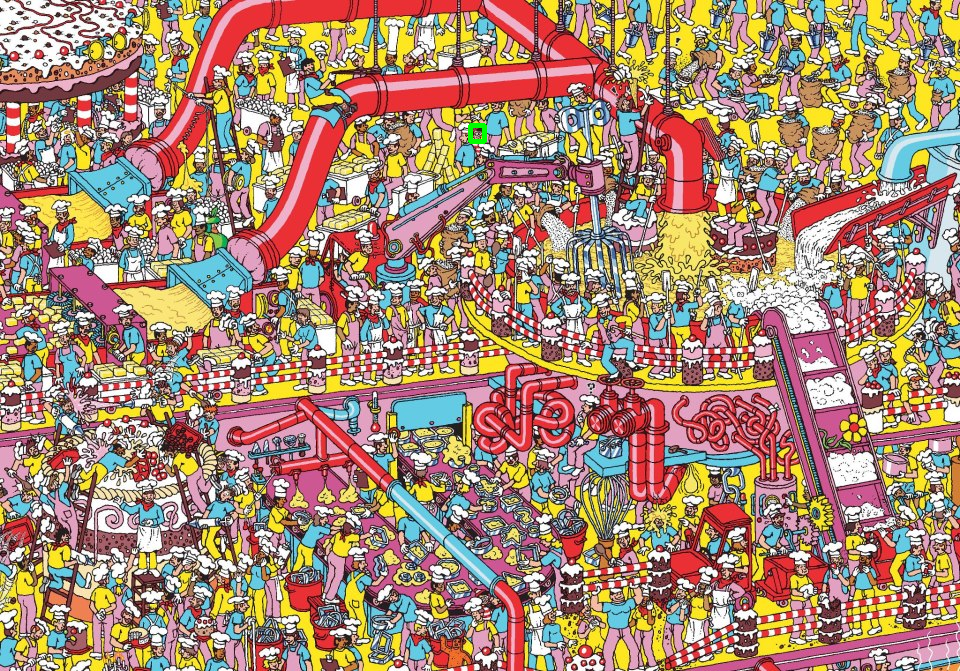

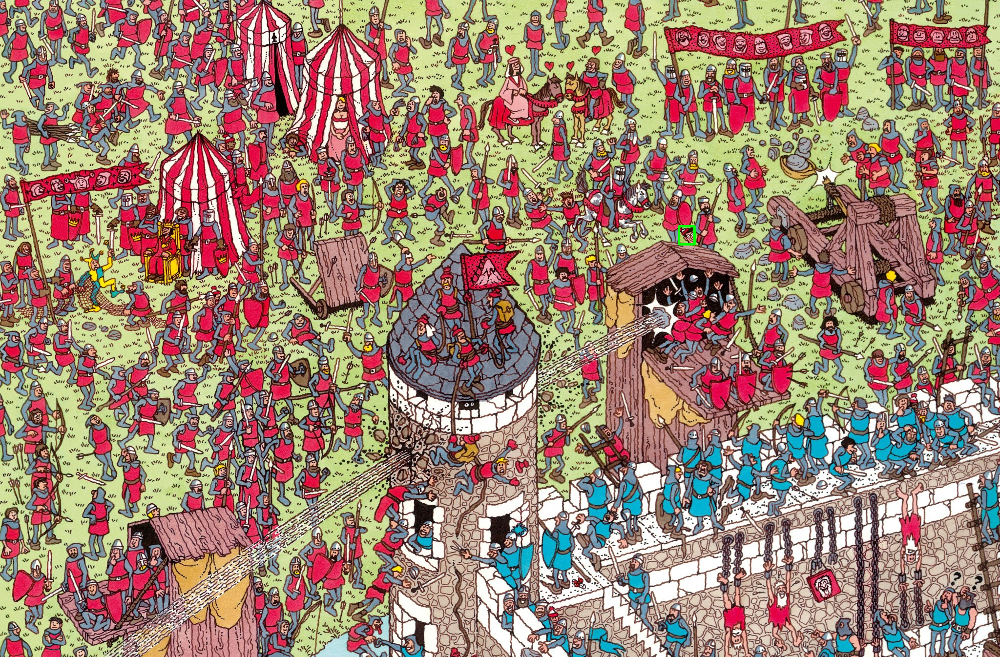

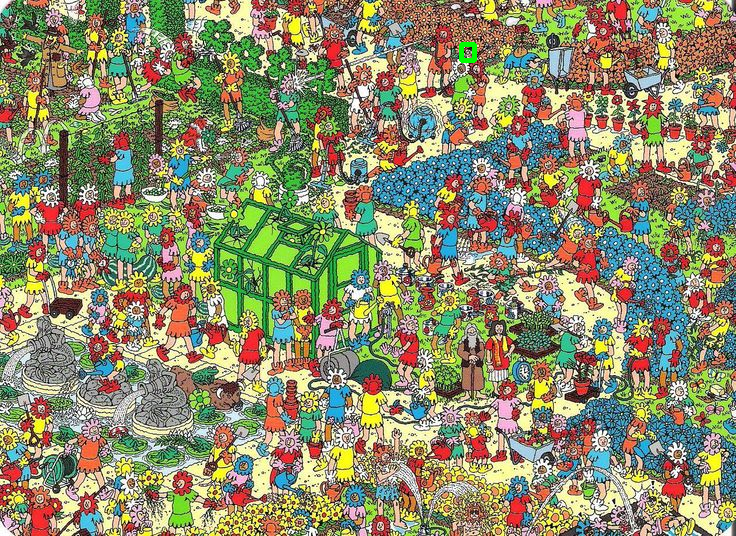

In [ ]:
for index, row in df.sample(3, random_state=123).iterrows():
    path = row["path"]
    display(draw_annotation(image_path=path, x_min=int(row["width"]*row["xmin"]), y_min=int(row["height"]*row["ymin"]), x_max=int(row["width"]*row["xmax"]), y_max=int(row["height"]*row["ymax"]), thickness=3))

#### Listado de imágenes

In [ ]:
ls_images = sorted([x for x in os.listdir(images_path) if not os.path.isdir(os.path.join(images_path, x))])

In [ ]:
ls_images

['1.jpg',
 '10.jpg',
 '11.jpg',
 '12.jpg',
 '13.jpg',
 '14.jpg',
 '15.jpg',
 '16.jpg',
 '17.jpg',
 '18.jpg',
 '19.jpg',
 '2.jpg',
 '20.jpg',
 '21.jpg',
 '22.jpg',
 '23.jpg',
 '24.jpg',
 '25.jpg',
 '26.jpg',
 '27.jpg',
 '28.jpg',
 '29.jpg',
 '3.jpg',
 '30.jpg',
 '31.jpg',
 '32.jpg',
 '33.jpg',
 '34.jpg',
 '35.jpg',
 '36.jpg',
 '4.jpg',
 '5.jpg',
 '6.jpg',
 '7.jpg',
 '8.jpg',
 '9.jpg']

In [ ]:
set([x.split(".")[-1] for x in ls_images])

{'jpg'}

In [ ]:
df

,filename,width,height,class,xmin,ymin,xmax,ymax,path,set,image_size,channels
0,1.jpg,2048,1251,waldo,0.344727,0.410072,0.362793,0.449241,./wheres_waldo/images/1.jpg,train,"(1251, 2048, 3)",3
1,10.jpg,1600,980,waldo,0.446875,0.160204,0.458125,0.184694,./wheres_waldo/images/10.jpg,val,"(980, 1600, 3)",3
2,11.jpg,2828,1828,waldo,0.162659,0.836980,0.170438,0.851751,./wheres_waldo/images/11.jpg,train,"(1828, 2828, 3)",3
3,12.jpg,1276,1754,waldo,0.663009,0.294755,0.688088,0.320981,./wheres_waldo/images/12.jpg,train,"(1754, 1276, 3)",3
4,13.jpg,1280,864,waldo,0.728125,0.317130,0.735938,0.333333,./wheres_waldo/images/13.jpg,val,"(864, 1280, 3)",3
5,14.jpg,1700,2340,waldo,0.115882,0.802564,0.139412,0.820085,./wheres_waldo/images/14.jpg,train,"(2340, 1700, 3)",3
6,15.jpg,1600,1006,waldo,0.185625,0.425447,0.194375,0.442346,./wheres_waldo/images/15.jpg,train,"(1006, 1600, 3)",3
7,17.jpg,1599,1230,waldo,0.469669,0.203252,0.482802,0.228455,./wheres_waldo/images/17.jpg,train,"(1230, 1599, 3)",3
8,18.jpg,1590,981,waldo,0.791824,0.076453,0.811321,0.113150,./wheres_waldo/images/18.jpg,train,"(981, 1590, 3)",3
9,19.jpg,1280,864,waldo,0.264062,0.721065,0.274219,0.740741,./wheres_waldo/images/19.jpg,train,"(864, 1280, 3)",3


### Preparación para entrenamiento

#### Generadores

In [ ]:
dgen_train = ImageDataGenerator(rescale=1./255,
                                validation_split=0.2)

In [ ]:
dgen_validation = ImageDataGenerator(rescale=1./255)

In [ ]:
dgen_test = ImageDataGenerator(rescale=1./255)

In [ ]:
TARGET_SIZE = (350, 500)
BATCH_SIZE = 512
CLASS_MODE = 'raw'

In [ ]:
dgen_train.flow_from_dataframe?

Signature:
dgen_train.flow_from_dataframe(
    dataframe,
    directory=None,
    x_col='filename',
    y_col='class',
    weight_col=None,
    target_size=(256, 256),
    color_mode='rgb',
    classes=None,
    class_mode='categorical',
    batch_size=32,
    shuffle=True,
    seed=None,
    save_to_dir=None,
    save_prefix='',
    save_format='png',
    subset=None,
    interpolation='nearest',
    validate_filenames=True,
    **kwargs,
)
Docstring:
Takes the dataframe and the path to a directory + generates batches.

 The generated batches contain augmented/normalized data.

**A simple tutorial can be found **[here](
                            http://bit.ly/keras_flow_from_dataframe).

Args:
    dataframe: Pandas dataframe containing the filepaths relative to
        `directory` (or absolute paths if `directory` is None) of the
        images in a string column. It should include other column/s
        depending on the `class_mode`:
        - if `class_mode` is `"categorical"` (de

#### "Train-test" split

In [ ]:
train = df.loc[df["set"]=="train"].copy()
val = df.loc[df["set"]=="val"].copy()

In [ ]:
train_generator = dgen_train.flow_from_dataframe(dataframe=train,
                                                 x_col="path",
                                                 y_col=["xmin",
                                                        "ymin",
                                                        "xmax",
                                                        "ymax"],
                                                 class_mode="raw",
                                                 subset="training",
                                                 target_size=TARGET_SIZE)

Found 30 validated image filenames.


In [ ]:
test_generator = dgen_train.flow_from_dataframe(dataframe=train,
                                                x_col="path",
                                                y_col=["xmin",
                                                       "ymin",
                                                       "xmax",
                                                       "ymax"],
                                                class_mode="raw",
                                                subset="validation",
                                                target_size=TARGET_SIZE)

Found 7 validated image filenames.


In [ ]:
val_generator = dgen_train.flow_from_dataframe(dataframe=val,
                                               x_col="path",
                                               y_col=["xmin",
                                                      "ymin",
                                                      "xmax",
                                                      "ymax"],
                                               class_mode="raw",
                                               target_size=TARGET_SIZE)

Found 6 validated image filenames.


## Modelado

### Modelo base

In [ ]:
model = Sequential()

2023-08-17 19:36:38.932901: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:266] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected


### Bloques convolucionales

In [ ]:
model.add(Conv2D(16, 3, padding = 'same', activation = 'relu', input_shape=train_generator.image_shape))
model.add(BatchNormalization())
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.2))
model.add(Conv2D(32, 3, padding = 'same', activation = 'relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.2))
model.add(Conv2D(64, 6, padding = 'valid', activation = 'relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.2))
model.add(Conv2D(64, 6, padding = 'valid', activation = 'relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.2))

### Capas densas

In [ ]:
model.add(Flatten())
model.add(Dense(1024, activation = 'relu'))
model.add(Dense(512, activation = 'relu'))
model.add(Dense(256, activation="sigmoid"))
model.add(Dense(4, activation="linear", kernel_regularizer="l2"))

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 350, 500, 16)      448       
                                                                 
 batch_normalization (BatchN  (None, 350, 500, 16)     64        
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 175, 250, 16)     0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 175, 250, 16)      0         
                                                                 
 conv2d_1 (Conv2D)           (None, 175, 250, 32)      4640      
                                                                 
 batch_normalization_1 (Batc  (None, 175, 250, 32)     1

### Configuración del modelo

#### Métricas

In [ ]:
kmetrics = [
    RootMeanSquaredError(name='rms'),
    MeanAbsoluteError(name='mae'),
]

#### Optimizador

In [ ]:
model.compile(Adam(learning_rate=0.01), loss="mse", metrics=kmetrics)

##### Callbacks

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_rms', patience=30)

In [ ]:
checkpoint = tf.keras.callbacks.ModelCheckpoint('models/waldo/model.h5',
                               save_best_only=True,
                               save_weights_only=False,
                               monitor='val_rms'
                                 )

### Entrenamiento

In [ ]:
history = model.fit(train_generator,
                    epochs=2_500,
                    validation_data=val_generator,
                    callbacks=[early_stopping, checkpoint])

Epoch 1/2500


2023-08-17 19:36:50.469392: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


1/1 [==============================] - ETA: 0s - loss: 2.0365 - rms: 1.3984 - mae: 1.1614

2023-08-17 19:36:52.194246: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


1/1 [==============================] - 2s 2s/step - loss: 2.0365 - rms: 1.3984 - mae: 1.1614 - val_loss: 22.9021 - val_rms: 4.7772 - val_mae: 4.0035
Epoch 2/2500
1/1 [==============================] - 1s 1s/step - loss: 23.4201 - rms: 4.8311 - mae: 4.0657 - val_loss: 17.6385 - val_rms: 4.1907 - val_mae: 3.3372
Epoch 3/2500
1/1 [==============================] - 1s 1s/step - loss: 18.0478 - rms: 4.2392 - mae: 3.4181 - val_loss: 12.4406 - val_rms: 3.5167 - val_mae: 2.7855
Epoch 4/2500
1/1 [==============================] - 1s 1s/step - loss: 12.7406 - rms: 3.5591 - mae: 2.8135 - val_loss: 8.0874 - val_rms: 2.8313 - val_mae: 2.0715
Epoch 5/2500
1/1 [==============================] - 1s 1s/step - loss: 8.2983 - rms: 2.8683 - mae: 2.1000 - val_loss: 4.9422 - val_rms: 2.2074 - val_mae: 1.3986
Epoch 6/2500
1/1 [==============================] - 1s 1s/step - loss: 5.0776 - rms: 2.2379 - mae: 1.4317 - val_loss: 3.0691 - val_rms: 1.7323 - val_mae: 1.1184
Epoch 7/2500
1/1 [=======================

### Performance

In [ ]:
results = pd.DataFrame(history.history)

In [ ]:
results

,loss,rms,mae,val_loss,val_rms,val_mae
0,2.036524,1.398428,1.161427,22.902121,4.777173,4.003535
1,23.420097,4.831083,4.065692,17.638538,4.190662,3.337219
2,18.047789,4.239210,3.418141,12.440629,3.516665,2.785450
3,12.740582,3.559057,2.813529,8.087355,2.831282,2.071472
4,8.298308,2.868294,2.100011,4.942169,2.207441,1.398604
...,...,...,...,...,...,...
113,0.105791,0.271411,0.238592,0.088436,0.237687,0.183014
114,0.105584,0.271374,0.238534,0.088074,0.237314,0.182508
115,0.105375,0.271328,0.238491,0.087662,0.236833,0.181899
116,0.105169,0.271286,0.238481,0.087284,0.236415,0.181353


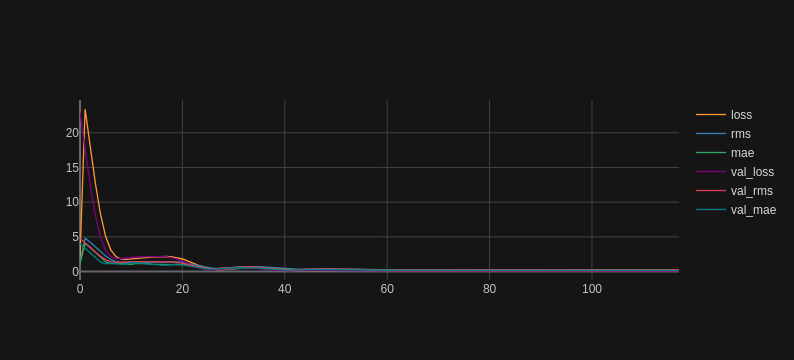

In [ ]:
results.iplot()

In [ ]:
test_loss, test_rms, test_mae = model.evaluate(test_generator)
print('Test loss: {:,.2f}\nTest RMS: {:,.2f}\nTest MAE: {:,.2f}'.format(test_loss, test_rms, test_mae))

1/1 [==============================] - 0s 180ms/step - loss: 0.1093 - rms: 0.2794 - mae: 0.2341
Test loss: 0.11
Test RMS: 0.28
Test MAE: 0.23


2023-08-17 19:40:39.115553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


### Predicción

In [ ]:
model = tf.keras.models.load_model(f'./models/waldo/model.h5')

In [ ]:
def find_waldo(file_path, model, target_size):
    test_image = load_img(file_path, target_size=target_size)
    img = img_to_array(test_image)
    height, width, _ = get_image_size(file_path)
    img = np.expand_dims(img, axis=0)
    prediction = model.predict(img)[0]
    return list(map(int, [prediction[0]*width, prediction[1]*height, prediction[2]*width, prediction[3]*height, ]))

In [ ]:
path = val.reset_index(drop=True).loc[3, "path"]

In [ ]:
path

'./wheres_waldo/images/21.jpg'

In [ ]:
position = find_waldo(path, model, TARGET_SIZE)

1/1 [==============================] - 0s 17ms/step


In [ ]:
position

[996, 482, 1149, 701]

In [ ]:
train

,filename,width,height,class,xmin,ymin,xmax,ymax,path,set,image_size,channels
0,1.jpg,2048,1251,waldo,0.344727,0.410072,0.362793,0.449241,./wheres_waldo/images/1.jpg,train,"(1251, 2048, 3)",3
2,11.jpg,2828,1828,waldo,0.162659,0.836980,0.170438,0.851751,./wheres_waldo/images/11.jpg,train,"(1828, 2828, 3)",3
3,12.jpg,1276,1754,waldo,0.663009,0.294755,0.688088,0.320981,./wheres_waldo/images/12.jpg,train,"(1754, 1276, 3)",3
5,14.jpg,1700,2340,waldo,0.115882,0.802564,0.139412,0.820085,./wheres_waldo/images/14.jpg,train,"(2340, 1700, 3)",3
6,15.jpg,1600,1006,waldo,0.185625,0.425447,0.194375,0.442346,./wheres_waldo/images/15.jpg,train,"(1006, 1600, 3)",3
7,17.jpg,1599,1230,waldo,0.469669,0.203252,0.482802,0.228455,./wheres_waldo/images/17.jpg,train,"(1230, 1599, 3)",3
8,18.jpg,1590,981,waldo,0.791824,0.076453,0.811321,0.113150,./wheres_waldo/images/18.jpg,train,"(981, 1590, 3)",3
9,19.jpg,1280,864,waldo,0.264062,0.721065,0.274219,0.740741,./wheres_waldo/images/19.jpg,train,"(864, 1280, 3)",3
10,2.jpg,1286,946,waldo,0.063764,0.550740,0.083204,0.585624,./wheres_waldo/images/2.jpg,train,"(946, 1286, 3)",3
11,3.jpg,2048,1346,waldo,0.678711,0.343982,0.694336,0.371471,./wheres_waldo/images/3.jpg,train,"(1346, 2048, 3)",3


In [ ]:
position = dict(zip(["x_min", "y_min", "x_max", "y_max"], position))

In [ ]:
position

{'x_min': 996, 'y_min': 482, 'x_max': 1149, 'y_max': 701}

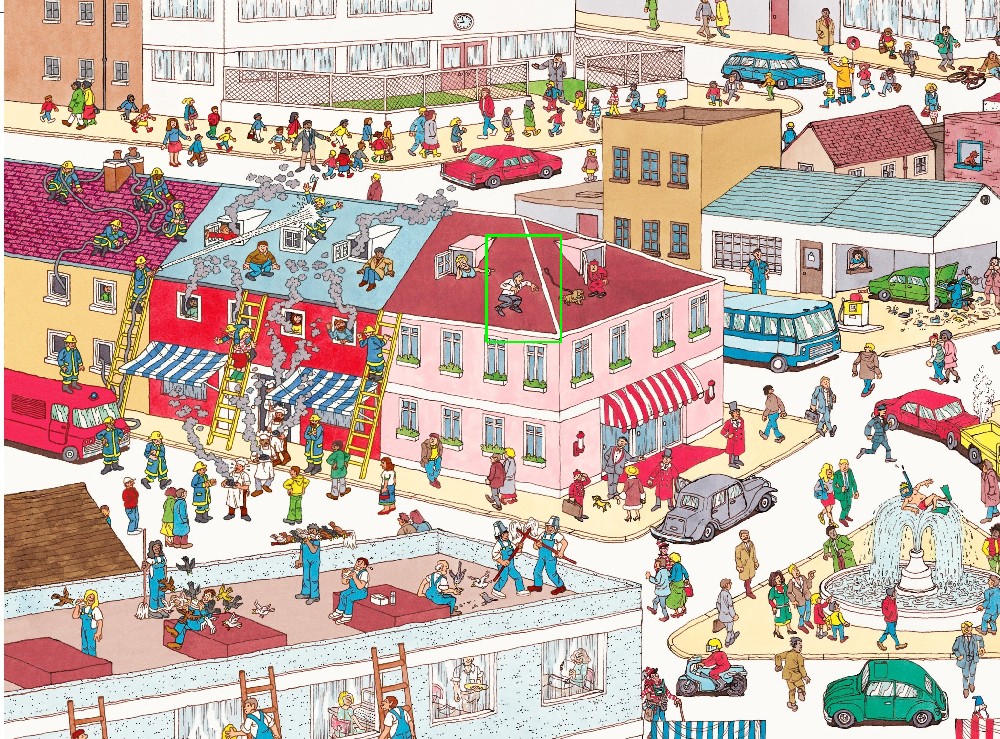

In [ ]:
draw_annotation(path, **position)